# Import

In [1]:
import torch
import torch.nn as nn
import numpy as np
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from torchvision import datasets, transforms
from torchvision.datasets import ImageFolder
import torchvision.models as models
from tqdm import tqdm
from torchvision.models.feature_extraction import create_feature_extractor
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from sklearn.svm import SVC
import torchvision
from scipy.spatial.distance import cdist
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import pickle
from scipy.spatial.distance import cdist
from sklearn.metrics.pairwise import cosine_similarity
import os

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Phase 1

## Data Loader

In [ ]:
batch_size = 64

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.1307,), (0.3081,))
])

# Load MNIST datasets
train_dataset = datasets.MNIST(root="./data", train=True, download=True, transform=transform)
test_dataset = datasets.MNIST(root="./data", train=False, download=True, transform=transform)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

## Models

### Sigmoid

In [ ]:
# Two Layer MLP
class MLP1(nn.Module):
    def __init__(self):
        super(MLP1, self).__init__()
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(784, 128)
        self.fc2 = nn.Linear(128, 10)
        self.sigmoid = nn.Sigmoid()
        self.softmax = nn.Softmax(dim=1)

    def forward(self, x):
        x = self.flatten(x)
        x = self.fc1(x)
        x = self.sigmoid(x)
        x = self.fc2(x)
        x = self.softmax(x)
        return x

In [ ]:
# Three Layer MLP
class MLP2(nn.Module):
    def __init__(self):
        super(MLP2, self).__init__()
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(784, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, 10)
        self.sigmoid1 = nn.Sigmoid()
        self.sigmoid2 = nn.Sigmoid()
        self.softmax = nn.Softmax(dim=1)

    def forward(self, x):
        x = self.flatten(x)
        x = self.fc1(x)
        x = self.sigmoid1(x)
        x = self.fc2(x)
        x = self.sigmoid2(x)
        x = self.fc3(x)
        x = self.softmax(x)
        return x

In [ ]:
# Four Layer MLP
class MLP3(nn.Module):
    def __init__(self):
        super(MLP3, self).__init__()
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(784, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, 32)
        self.fc4 = nn.Linear(32, 10)
        self.sigmoid1 = nn.Sigmoid()
        self.sigmoid2 = nn.Sigmoid()
        self.sigmoid3 = nn.Sigmoid()
        self.softmax = nn.Softmax(dim=1)

    def forward(self, x):
        x = self.flatten(x)
        x = self.fc1(x)
        x = self.sigmoid1(x)
        x = self.fc2(x)
        x = self.sigmoid2(x)
        x = self.fc3(x)
        x = self.sigmoid3(x)
        x = self.fc4(x)
        x = self.softmax(x)
        return x

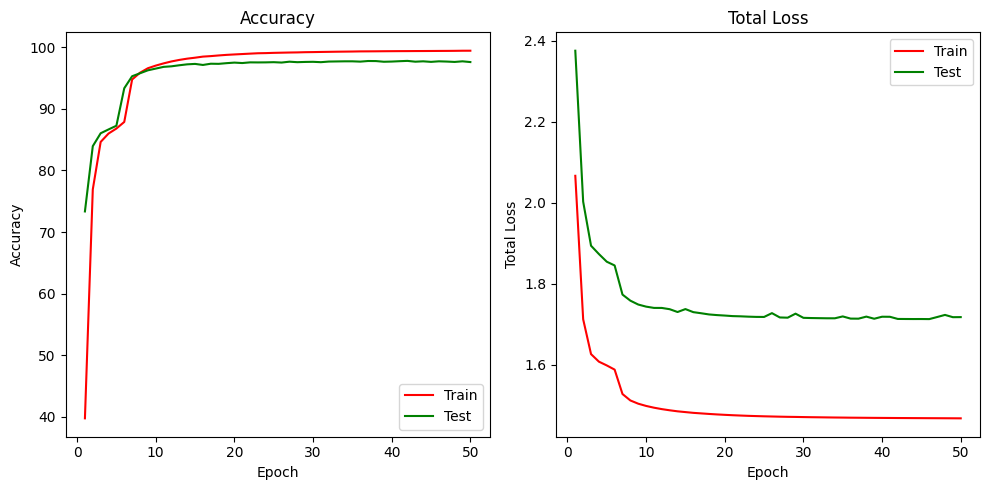

In [ ]:
# MLP with Sigmoid Activation Function
info_to_plot([acc_history, loss_history], epoch)

### ReLu

In [ ]:
# Four Layer MLP
class MLP4(nn.Module):
    def __init__(self):
        super(MLP4, self).__init__()
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(784, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, 32)
        self.fc4 = nn.Linear(32, 10)
        self.relu1 = nn.ReLU()
        self.relu2 = nn.ReLU()
        self.relu3 = nn.ReLU()
        self.softmax = nn.Softmax(dim=1)

    def forward(self, x):
        x = self.flatten(x)
        x = self.fc1(x)
        x = self.relu1(x)
        x = self.fc2(x)
        x = self.relu2(x)
        x = self.fc3(x)
        x = self.relu3(x)
        x = self.fc4(x)
        x = self.softmax(x)
        return x

In [ ]:
# Five Layer MLP
class MLP5(nn.Module):
    def __init__(self):
        super(MLP5, self).__init__()
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(784, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, 32)
        self.fc4 = nn.Linear(32, 16)
        self.fc5 = nn.Linear(16, 10)
        self.relu1 = nn.ReLU()
        self.relu2 = nn.ReLU()
        self.relu3 = nn.ReLU()
        self.relu4 = nn.ReLU()
        self.softmax = nn.Softmax(dim=1)

    def forward(self, x):
        x = self.flatten(x)
        x = self.fc1(x)
        x = self.relu1(x)
        x = self.fc2(x)
        x = self.relu2(x)
        x = self.fc3(x)
        x = self.relu3(x)
        x = self.fc4(x)
        x = self.relu4(x)
        x = self.fc5(x)
        x = self.softmax(x)
        return x

In [ ]:
# Initialize the network and optimizer
learning_rate = 0.1

model = MLP4()
optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)

# Loss function
criterion = nn.CrossEntropyLoss()

In [ ]:
num_batches = len(train_loader)
print(num_batches)
num_samples = len(train_loader.dataset)
acc_history = {'train': [], 'test': []}
loss_history = {'train': [], 'test': []}
min_delta = 0.005
patience = 6
best_loss = float('inf')
best_accuracy = 0

counter = 0

for epoch in range(50):
    print("Epoch", str(epoch) + "/50")
    # Train
    model_save_dir = 'saved_models'
    os.makedirs(model_save_dir, exist_ok=True)
    model.train()
    correct = 0
    total_loss = 0.0
    for (data, target) in train_loader:
        data = data.to('cpu')
        target = target.to('cpu')

        output = model(data)
        loss = criterion(output, target)
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        _, predictions = torch.max(output, dim=1)
        correct += torch.sum(predictions == target)
        total_loss += loss.item()
    epoch_accuracy = (correct / num_samples) * 100
    epoch_loss = total_loss / num_batches
    acc_history['train'].append(epoch_accuracy)
    loss_history['train'].append(epoch_loss)
    print('Train - Accuracy:', str(epoch_accuracy.item()) + ', Loss:' , epoch_loss)

    #Test
    model.eval()
    total = 0
    correct = 0
    total_loss += 0.0
    y_true = []
    y_pred = []
    with torch.no_grad():
        for data, target in test_loader:
            data = data.to('cpu')
            target = target.to('cpu')  # Move target to the same device as data
            output = model(data)
            _, predicted = torch.max(output.data, 1)
            total += target.size(0)
            correct += (predicted == target).sum().item()
            total_loss += loss.item()
            y_true.extend(target.tolist())
            y_pred.extend(predicted.tolist())

    accuracy = 100 * correct / total
    epoch_loss = total_loss / num_batches
    acc_history['test'].append(accuracy)
    loss_history['test'].append(epoch_loss)
    print('Test - Accuracy:', str(accuracy) + ', Loss:' , epoch_loss)
    print()

    if accuracy > best_accuracy:
                best_accuracy = accuracy
                model_checkpoint = {
                    'epoch': epoch,
                    'model_state_dict': model.state_dict(),
                    'optimizer_state_dict': optimizer.state_dict(),
                    'accuracy': accuracy,
                    'loss': epoch_loss
                }
                model_save_path = os.path.join(model_save_dir, f'model_best_accuracy.pt')
                torch.save(model_checkpoint, model_save_path)

938
Epoch 0/50
Train - Accuracy: 56.47500228881836, Loss: 1.9266488417379384
Test - Accuracy: 76.09, Loss: 2.207905135937591

Epoch 1/50
Train - Accuracy: 78.56500244140625, Loss: 1.6799297546272847
Test - Accuracy: 84.41, Loss: 1.9646221447600993

Epoch 2/50
Train - Accuracy: 85.41166687011719, Loss: 1.60938828497299
Test - Accuracy: 85.73, Loss: 1.872561687853799

Epoch 3/50
Train - Accuracy: 86.6199951171875, Loss: 1.5966144266413218
Test - Accuracy: 86.48, Loss: 1.8700365178874816

Epoch 4/50
Train - Accuracy: 87.2933349609375, Loss: 1.5890532706592129
Test - Accuracy: 87.3, Loss: 1.8446459926521854

Epoch 5/50
Train - Accuracy: 87.82499694824219, Loss: 1.5836135634481272
Test - Accuracy: 87.97, Loss: 1.8490861636489184

Epoch 6/50
Train - Accuracy: 88.211669921875, Loss: 1.579755313996313
Test - Accuracy: 88.13, Loss: 1.844962180931685

Epoch 7/50
Train - Accuracy: 88.45999908447266, Loss: 1.5768324097336481
Test - Accuracy: 87.48, Loss: 1.8603615234655613

Epoch 8/50
Train - Accu

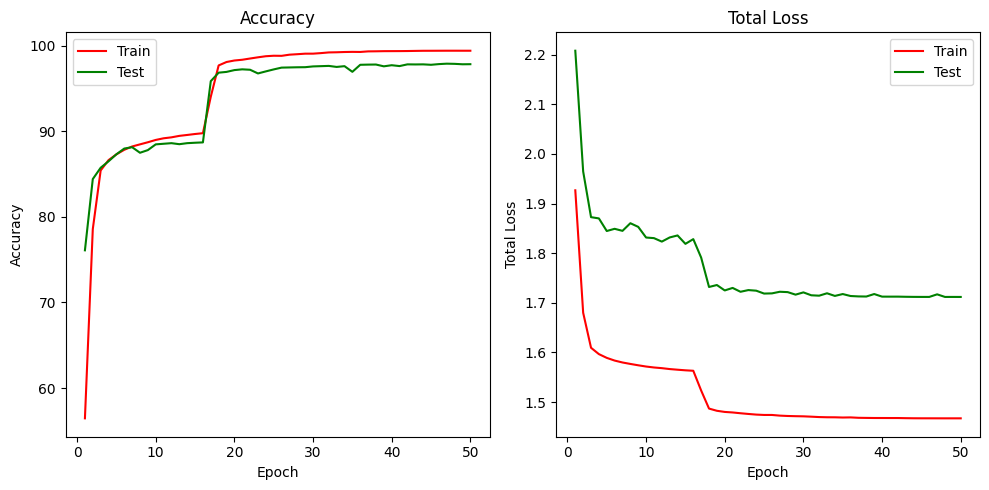

In [ ]:
info_to_plot([acc_history, loss_history], epoch)

In [ ]:
def info_to_plot(result, epoch):
    train_accs = result[0]['train']
    train_total_losses = result[1]['train']

    test_accs = result[0]['test']
    test_total_losses = result[1]['test']

    train_accs = np.array([item.item() if hasattr(item, 'item') else item for item in train_accs])
    train_total_losses = np.array([item.item() if hasattr(item, 'item') else item for item in train_total_losses])

    test_accs = np.array([item.item() if hasattr(item, 'item') else item for item in test_accs])
    test_total_losses = np.array([item.item() if hasattr(item, 'item') else item for item in test_total_losses])

    plotter(train_accs, train_total_losses, test_accs, test_total_losses, epoch)

In [ ]:
def plotter(train_accs, train_total_losses, test_accs, test_total_losses, epoch):
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))  # Adjusted figsize for clarity
    ranges = [i for i in range(1 , epoch+2)]



    axs[0].plot(ranges, train_accs, color='red', label='Train')
    axs[0].plot(ranges, test_accs, color='green', label='Test')
    axs[0].set_title('Accuracy')
    axs[0].set_xlabel('Epoch')
    axs[0].set_ylabel('Accuracy')
    axs[0].legend()

    axs[1].plot(ranges, train_total_losses, color='red', label='Train')
    axs[1].plot(ranges, test_total_losses, color='green', label='Test')
    axs[1].set_title('Total Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].set_ylabel('Total Loss')
    axs[1].legend()

    plt.tight_layout()
    plt.savefig('accuracy_and_loss_plot.png', dpi=100)  # Adjusted filename


# Phase 2

In [ ]:
!wget http://www.robots.ox.ac.uk/~vgg/data/pets/data/images.tar.gz
!wget http://www.robots.ox.ac.uk/~vgg/data/pets/data/annotations.tar.gz

In [ ]:
!tar -xf images.tar.gz
!tar -xf annotations.tar.gz

In [ ]:
image_dir = "./images/"
annotation_dir = "./annotations/"

# Choose an image file to load
image_file = "Abyssinian_1.jpg"
image_path = os.path.join(image_dir, image_file)

# Load the image using OpenCV
image = cv2.imread(image_path)

# Convert the image from BGR to RGB (OpenCV loads images in BGR format)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display the image
plt.imshow(image_rgb)
plt.axis('off')
plt.show()

In [ ]:
import os

list_file_path = "/content/drive/MyDrive/Vision_Project/annotations/list.txt"

with open(list_file_path, "r") as f:
    lines = f.readlines()
    lines = lines[6:]
print(len(lines))

# for line in lines:
#     image_name, class_id = line.split(" ", 1)
#     class_id, _ = class_id.split(" ", 1)
#     class_name = class_id.strip()
#     os.makedirs(os.path.join("/content/drive/MyDrive/Vision_Project/new_images", class_name), exist_ok=True)

for line in lines:
    image_name, class_id = line.split(" ", 1)
    class_id, _ = class_id.split(" ", 1)
    class_name = class_id.strip()
    image_path = os.path.join("/content/drive/MyDrive/Vision_Project/dataset_new/annotations/trimaps", image_name + ".png")
    new_image_path = os.path.join("/content/drive/MyDrive/Vision_Project/new_images", class_name, image_name)
    os.rename(image_path, new_image_path)


In [ ]:
import os
import shutil

source_dir = "/content/drive/MyDrive/Vision_Project/dataset_new/images"

destination_dir = "/content/drive/MyDrive/Vision_Project/new_image/17"

file_name_prefix = "_basset_hound"
for filename in os.listdir(source_dir):
    if filename.startswith(file_name_prefix):

        image_path = os.path.join(source_dir, filename)
        new_image_path = os.path.join(destination_dir, filename)
        os.rename(image_path, new_image_path)

## Data Loader

In [2]:
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.RandomResizedCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

dataset_root = "/content/drive/MyDrive/Vision_project/dataLoader"

# Load the dataset using ImageFolder
dataset = ImageFolder(root=dataset_root, transform=transform)

# Create a DataLoader for batch processing
batch_size = 32
data_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
print(len(data_loader))
print(len(dataset))

231
7390


## Classifier

In [3]:
def classify(features, labels):
    X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=20)
    svm = SVC(kernel='rbf', C=10, gamma='auto', probability=True)
    svm.fit(X_train, y_train)
    y_pred = svm.predict(X_test)

    # Accuracy
    acc = accuracy_score(y_test, y_pred) * 100
    print("Accuracy: {}".format(acc))

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.imshow(cm, cmap=plt.cm.Blues)
    plt.colorbar()
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    plt.show()

    # ROC Curve
    # roc_auc = roc_auc_score(y_test, svm.predict_proba(X_test), multi_class='ovr')
    # fpr, tpr, _ = roc_curve(y_test, svm.predict_proba(X_test)[:, 1])  # Assuming you want the ROC curve for class 1

    # plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
    # plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
    # plt.xlim([0.0, 1.0])
    # plt.ylim([0.0, 1.05])
    # plt.xlabel('False Positive Rate')
    # plt.ylabel('True Positive Rate')
    # plt.title('Receiver Operating Characteristic')
    # plt.legend(loc="lower right")
    # plt.show()

## Resnet18

### Layer 1

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = torchvision.models.resnet18(weights=torchvision.models.ResNet18_Weights.DEFAULT).to(device)
 # extract layer1 and layer3, giving as names `feat1` and feat2`
model = create_feature_extractor(
     model, {'layer1': 'feat1'})

In [54]:
features = np.empty((0, 200704))
n_components = 900
pca_features = np.empty((0, 900))
labels = np.empty((0))
i = 0
for images, target in tqdm(data_loader):

    output = model(images.to(device))
    feature = output["feat1"].view(images.shape[0], -1)
    features = np.append(features, feature.cpu().detach().numpy(), axis = 0)
    labels = np.append(labels, target, axis = 0)
    if i % 40 == 39:
      scaler = StandardScaler()
      X_scaled = scaler.fit_transform(features)
      del features, scaler
      features = np.empty((0, 200704))
      pca = PCA(n_components=n_components)
      pca_feature = pca.fit_transform(X_scaled)
      del X_scaled, pca
      pca_features = np.append(pca_features, pca_feature, axis = 0)
    i += 1
scaler = StandardScaler()
X_scaled = scaler.fit_transform(features)
del features
pca = PCA(n_components=n_components)
pca_feature = pca.fit_transform(X_scaled)
del X_scaled
pca_features = np.append(pca_features, pca_feature, axis = 0)
print(pca_features.shape)
print(labels.shape)

100%|██████████| 231/231 [22:54<00:00,  5.95s/it]


(7390, 900)
(7390,)


Accuracy: 1.8267929634641407


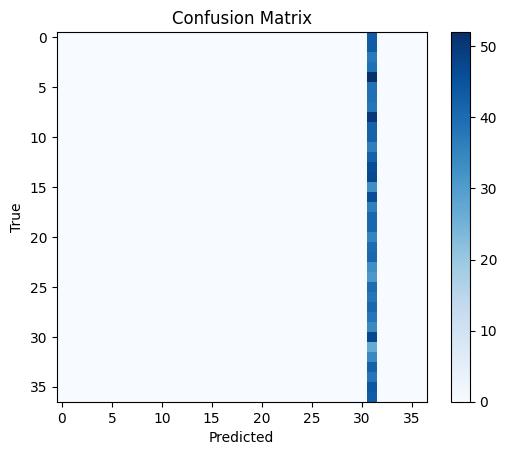

In [55]:
classify(pca_features, labels)

### Layer 3

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = torchvision.models.resnet18(weights=torchvision.models.ResNet18_Weights.DEFAULT).to(device)
model = create_feature_extractor(
     model, {'layer3': 'feat2'})

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 115MB/s]


#### Feature Extractor

In [ ]:
features = np.empty((0, 50176))
labels = np.empty((0))

for images, target in tqdm(data_loader):

    output = model(images.to(device))
    feature = output["feat2"].view(images.shape[0], -1)
    features = np.append(features, feature.cpu().detach().numpy(), axis = 0)
    labels = np.append(labels, target, axis = 0)
print(features.shape)
print(labels.shape)

100%|██████████| 232/232 [13:32<00:00,  3.50s/it]

(7420, 50176)
(7420,)


In [ ]:
%cd "/content/drive/MyDrive/Vision_Project/Features"
with open('resnet-layer3-features.pkl', 'wb') as f:
    pickle.dump(features, f)
with open('resnet-layer3-labels.pkl', 'wb') as f:
    pickle.dump(labels, f)

/content/drive/MyDrive/Vision_Project/Features


In [ ]:
features_pickle_file_path = '/content/drive/MyDrive/Vision_Project/Features/resnet-layer3-features.pkl'
label_pickle_file_path = '/content/drive/MyDrive/Vision_Project/Features/resnet-layer3-labels.pkl'

with open(features_pickle_file_path, 'rb') as file:
  features = pickle.load(file)

with open(label_pickle_file_path, 'rb') as file:
  labels = pickle.load(file)

#### PCA

In [ ]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(features)
del features
n_components = 3000
pca = PCA(n_components=n_components)
X_pca = pca.fit_transform(X_scaled)
del X_scaled

In [ ]:
print(X_pca.shape)

(7420, 3000)


#### classification

Accuracy: 2.2911051212938007


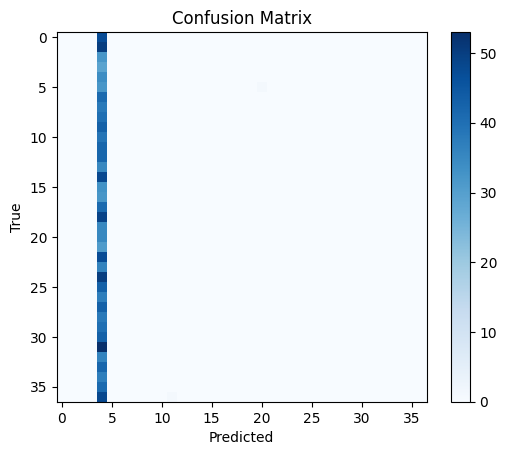

In [ ]:
classify(X_pca, labels)

### AvgPool

In [27]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = torchvision.models.resnet18(weights=torchvision.models.ResNet18_Weights.DEFAULT).to(device)
model = create_feature_extractor(
     model, {'avgpool': 'feat3'})

#### Extracting features

In [28]:
%cd "/content/drive/MyDrive/Vision_project/Features/resnet_images"
features = np.empty((0, 512))
labels = np.empty((0))
i = 0
for images, target in tqdm(data_loader):
    output = model(images.to(device))
    feature = output["feat3"].view(images.shape[0], -1)
    features = np.append(features, feature.cpu().detach().numpy(), axis = 0)
    labels = np.append(labels, target, axis = 0)
    with open('images{}.pkl'.format(i), 'wb') as f:
      pickle.dump(images, f)
    i += 1
print(features.shape)
print(labels.shape)

/content/drive/MyDrive/Vision_project/Features/resnet_images


100%|██████████| 231/231 [01:59<00:00,  1.94it/s]

(7390, 512)
(7390,)


In [29]:
%cd "/content/drive/MyDrive/Vision_project/Features"
with open('resnet-avgpool-features.pkl', 'wb') as f:
    pickle.dump(features, f)
with open('resnet-avgpool-labels.pkl', 'wb') as f:
    pickle.dump(labels, f)

/content/drive/MyDrive/Vision_project/Features


#### Classification

Accuracy: 77.89757412398922


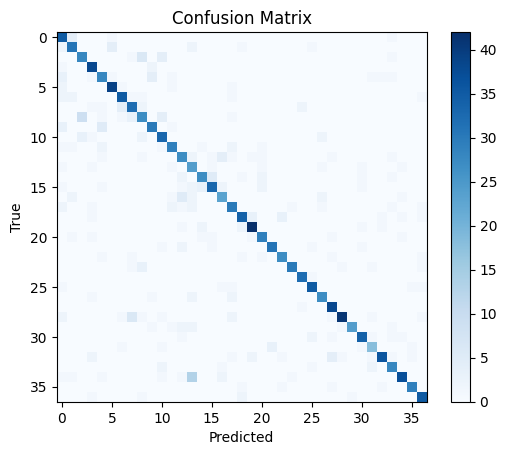

In [ ]:
classify(features, labels)



## Mobile-Net

### features.1.conv.2

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = torchvision.models.mobilenet_v2(weights=torchvision.models.MobileNet_V2_Weights.IMAGENET1K_V2).to(device)
print(torchvision.models.feature_extraction.get_graph_node_names(model)[0])
 # extract layer1 and layer3, giving as names `feat1` and feat2`
model = create_feature_extractor(
    model, { 'features.1.conv.2': 'feat1'})

/usr/local/lib/python3.10/dist-packages/torch/overrides.py:110: UserWarning: 'has_cuda' is deprecated, please use 'torch.backends.cuda.is_built()'
  torch.has_cuda,
/usr/local/lib/python3.10/dist-packages/torch/overrides.py:111: UserWarning: 'has_cudnn' is deprecated, please use 'torch.backends.cudnn.is_available()'
  torch.has_cudnn,
/usr/local/lib/python3.10/dist-packages/torch/overrides.py:117: UserWarning: 'has_mps' is deprecated, please use 'torch.backends.mps.is_built()'
  torch.has_mps,
/usr/local/lib/python3.10/dist-packages/torch/overrides.py:118: UserWarning: 'has_mkldnn' is deprecated, please use 'torch.backends.mkldnn.is_available()'
  torch.has_mkldnn,


['x', 'features.0', 'features.1.conv.0', 'features.1.conv.1', 'features.1.conv.2', 'features.2.conv.0', 'features.2.conv.1', 'features.2.conv.2', 'features.2.conv.3', 'features.3.conv.0', 'features.3.conv.1', 'features.3.conv.2', 'features.3.conv.3', 'features.3.add', 'features.4.conv.0', 'features.4.conv.1', 'features.4.conv.2', 'features.4.conv.3', 'features.5.conv.0', 'features.5.conv.1', 'features.5.conv.2', 'features.5.conv.3', 'features.5.add', 'features.6.conv.0', 'features.6.conv.1', 'features.6.conv.2', 'features.6.conv.3', 'features.6.add', 'features.7.conv.0', 'features.7.conv.1', 'features.7.conv.2', 'features.7.conv.3', 'features.8.conv.0', 'features.8.conv.1', 'features.8.conv.2', 'features.8.conv.3', 'features.8.add', 'features.9.conv.0', 'features.9.conv.1', 'features.9.conv.2', 'features.9.conv.3', 'features.9.add', 'features.10.conv.0', 'features.10.conv.1', 'features.10.conv.2', 'features.10.conv.3', 'features.10.add', 'features.11.conv.0', 'features.11.conv.1', 'fea

In [8]:
features = np.empty((0, 200704))
n_components = 900
pca_features = np.empty((0, 900))
labels = np.empty((0))
i = 0
for images, target in tqdm(data_loader):

    output = model(images.to(device))
    feature = output["feat1"].view(images.shape[0], -1)
    features = np.append(features, feature.cpu().detach().numpy(), axis = 0)
    labels = np.append(labels, target, axis = 0)
    if i % 40 == 39:
      scaler = StandardScaler()
      X_scaled = scaler.fit_transform(features)
      del features, scaler
      features = np.empty((0, 200704))
      pca = PCA(n_components=n_components)
      pca_feature = pca.fit_transform(X_scaled)
      del X_scaled, pca
      pca_features = np.append(pca_features, pca_feature, axis = 0)
    i += 1
scaler = StandardScaler()
X_scaled = scaler.fit_transform(features)
del features
pca = PCA(n_components=n_components)
pca_feature = pca.fit_transform(X_scaled)
del X_scaled
pca_features = np.append(pca_features, pca_feature, axis = 0)
print(pca_features.shape)
print(labels.shape)

100%|██████████| 231/231 [23:57<00:00,  6.22s/it]


(7390, 900)
(7390,)


Accuracy: 1.6238159675236805


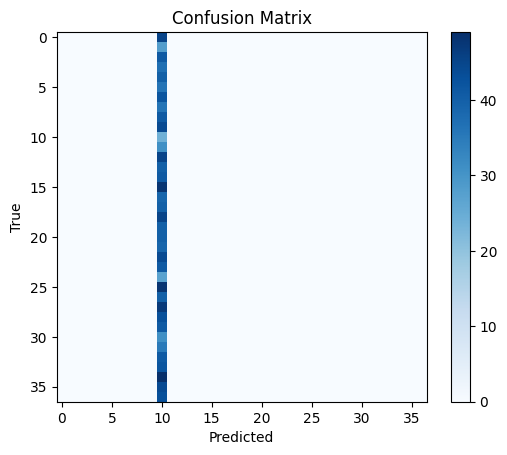

In [10]:
classify(pca_features, labels)

### Features.16.conv.3

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = torchvision.models.mobilenet_v2(weights=torchvision.models.MobileNet_V2_Weights.IMAGENET1K_V2).to(device)
print(torchvision.models.feature_extraction.get_graph_node_names(model)[0])
 # extract layer1 and layer3, giving as names `feat1` and feat2`
model = create_feature_extractor(
    model, { 'features.16.conv.3': 'feat2'})

['x', 'features.0', 'features.1.conv.0', 'features.1.conv.1', 'features.1.conv.2', 'features.2.conv.0', 'features.2.conv.1', 'features.2.conv.2', 'features.2.conv.3', 'features.3.conv.0', 'features.3.conv.1', 'features.3.conv.2', 'features.3.conv.3', 'features.3.add', 'features.4.conv.0', 'features.4.conv.1', 'features.4.conv.2', 'features.4.conv.3', 'features.5.conv.0', 'features.5.conv.1', 'features.5.conv.2', 'features.5.conv.3', 'features.5.add', 'features.6.conv.0', 'features.6.conv.1', 'features.6.conv.2', 'features.6.conv.3', 'features.6.add', 'features.7.conv.0', 'features.7.conv.1', 'features.7.conv.2', 'features.7.conv.3', 'features.8.conv.0', 'features.8.conv.1', 'features.8.conv.2', 'features.8.conv.3', 'features.8.add', 'features.9.conv.0', 'features.9.conv.1', 'features.9.conv.2', 'features.9.conv.3', 'features.9.add', 'features.10.conv.0', 'features.10.conv.1', 'features.10.conv.2', 'features.10.conv.3', 'features.10.add', 'features.11.conv.0', 'features.11.conv.1', 'fea

#### Feature Extractor

In [ ]:
features = np.empty((0, 7840))
labels = np.empty((0))

for images, target in tqdm(data_loader):

    output = model(images.to(device))
    feature = output["feat2"].view(images.shape[0], -1)
    features = np.append(features, feature.cpu().detach().numpy(), axis = 0)
    labels = np.append(labels, target, axis = 0)

print(features.shape)
print(labels.shape)

100%|██████████| 232/232 [11:48<00:00,  3.05s/it]

(7420, 7840)
(7420,)


In [ ]:
%cd "/content/drive/MyDrive/Vision_Project/Features"
with open('mobile-16-features.pkl', 'wb') as f:
    pickle.dump(features, f)
with open('mobile-16-labels.pkl', 'wb') as f:
    pickle.dump(labels, f)

/content/drive/MyDrive/Vision_Project/Features


#### classification

Accuracy: 5.727762803234501


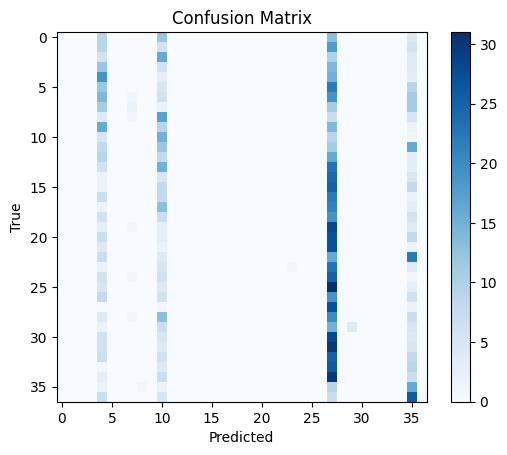

In [ ]:
classify(features, labels)

### AvgPool

In [25]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = torchvision.models.mobilenet_v2(weights=torchvision.models.MobileNet_V2_Weights.IMAGENET1K_V2).to(device)
print(torchvision.models.feature_extraction.get_graph_node_names(model)[0])
 # extract layer1 and layer3, giving as names `feat1` and feat2`
model = create_feature_extractor(
    model, { 'adaptive_avg_pool2d': 'feat3'})

Downloading: "https://download.pytorch.org/models/mobilenet_v2-7ebf99e0.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-7ebf99e0.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 101MB/s] 


['x', 'features.0', 'features.1.conv.0', 'features.1.conv.1', 'features.1.conv.2', 'features.2.conv.0', 'features.2.conv.1', 'features.2.conv.2', 'features.2.conv.3', 'features.3.conv.0', 'features.3.conv.1', 'features.3.conv.2', 'features.3.conv.3', 'features.3.add', 'features.4.conv.0', 'features.4.conv.1', 'features.4.conv.2', 'features.4.conv.3', 'features.5.conv.0', 'features.5.conv.1', 'features.5.conv.2', 'features.5.conv.3', 'features.5.add', 'features.6.conv.0', 'features.6.conv.1', 'features.6.conv.2', 'features.6.conv.3', 'features.6.add', 'features.7.conv.0', 'features.7.conv.1', 'features.7.conv.2', 'features.7.conv.3', 'features.8.conv.0', 'features.8.conv.1', 'features.8.conv.2', 'features.8.conv.3', 'features.8.add', 'features.9.conv.0', 'features.9.conv.1', 'features.9.conv.2', 'features.9.conv.3', 'features.9.add', 'features.10.conv.0', 'features.10.conv.1', 'features.10.conv.2', 'features.10.conv.3', 'features.10.add', 'features.11.conv.0', 'features.11.conv.1', 'fea

#### Feature Extractor

In [30]:
%cd "/content/"
features = np.empty((0, 1280))
labels = np.empty((0))
i = 0
for images, target in tqdm(data_loader):

    output = model(images.to(device))
    feature = output["feat3"].view(images.shape[0], -1)
    features = np.append(features, feature.cpu().detach().numpy(), axis = 0)
    labels = np.append(labels, target, axis = 0)
    with open('images{}.pkl'.format(i), 'wb') as f:
      pickle.dump(images, f)
    i += 1
print(features.shape)
print(labels.shape)

/content


100%|██████████| 231/231 [32:08<00:00,  8.35s/it]

(7390, 1280)
(7390,)


In [32]:
%cd "/content/drive/MyDrive/Vision_project/Features"

with open('mobile-avgpool-features.pkl', 'wb') as f:
    pickle.dump(features, f)
with open('mobile-avgpool-labels.pkl', 'wb') as f:
    pickle.dump(labels, f)

/content/drive/MyDrive/Vision_project/Features


#### Classification

Accuracy: 71.7654986522911


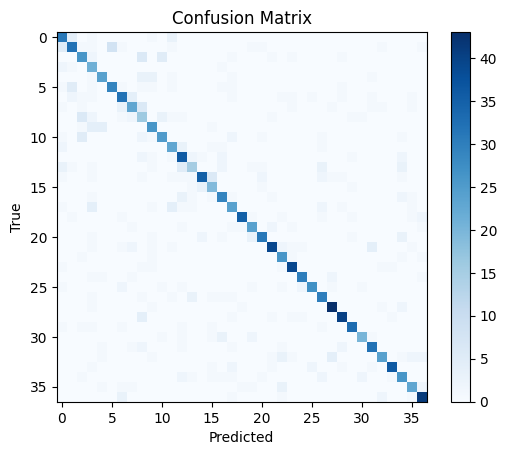

In [ ]:
classify(features, labels)

## Google-Net

### Inception(3b)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = torchvision.models.googlenet(weights=torchvision.models.GoogLeNet_Weights.IMAGENET1K_V1).to(device)
print(torchvision.models.feature_extraction.get_graph_node_names(model)[0])
# print(model)
 # extract layer1 and layer3, giving as names `feat1` and feat2`
model = create_feature_extractor(
    model, { 'inception3b': 'feat1'})

In [ ]:
features = np.empty((0, 376320))
n_components = 900
pca_features = np.empty((0, 900))
labels = np.empty((0))
i = 0
for images, target in tqdm(data_loader):

    output = model(images.to(device))
    feature = output["feat1"].view(images.shape[0], -1)
    features = np.append(features, feature.cpu().detach().numpy(), axis = 0)
    labels = np.append(labels, target, axis = 0)
    if i % 40 == 39:
      scaler = StandardScaler()
      X_scaled = scaler.fit_transform(features)
      del features, scaler
      features = np.empty((0, 200704))
      pca = PCA(n_components=n_components)
      pca_feature = pca.fit_transform(X_scaled)
      del X_scaled, pca
      pca_features = np.append(pca_features, pca_feature, axis = 0)
    i += 1
scaler = StandardScaler()
X_scaled = scaler.fit_transform(features)
del features
pca = PCA(n_components=n_components)
pca_feature = pca.fit_transform(X_scaled)
del X_scaled
pca_features = np.append(pca_features, pca_feature, axis = 0)
print(pca_features.shape)
print(labels.shape)

 17%|█▋        | 39/231 [00:50<05:46,  1.81s/it]

In [ ]:
classify(features, labels)

### Inception(4e)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = torchvision.models.googlenet(weights=torchvision.models.GoogLeNet_Weights.IMAGENET1K_V1).to(device)
print(torchvision.models.feature_extraction.get_graph_node_names(model)[0])

model = create_feature_extractor(
    model, { 'inception4e': 'feat2'})

#### Feature Extractor

In [ ]:
features = np.empty((0, 163072))
n_components = 1000
pca_features = np.empty((0, 1000))
labels = np.empty((0))
i = 0
for images, target in tqdm(data_loader):
    output = model(images.to(device))
    feature = output["feat2"].view(images.shape[0], -1)
    features = np.append(features, feature.cpu().detach().numpy(), axis = 0)
    labels = np.append(labels, target, axis = 0)
    if i > 0 and i % 58 == 0:
      scaler = StandardScaler()
      X_scaled = scaler.fit_transform(features)
      del features
      features = np.empty((0, 163072))
      pca = PCA(n_components=n_components)
      pca_feature = pca.fit_transform(X_scaled)
      del X_scaled
      pca_features = np.append(pca_features, pca_feature, axis = 0)
    i += 1
scaler = StandardScaler()
X_scaled = scaler.fit_transform(features)
del features
pca = PCA(n_components=n_components)
pca_feature = pca.fit_transform(X_scaled)
del X_scaled
pca_features = np.append(pca_features, pca_feature, axis = 0)
print(pca_features.shape)
print(labels.shape)

100%|██████████| 232/232 [17:41<00:00,  4.57s/it]


(7420, 1000)
(7420,)


#### Classification

Accuracy: 2.628032345013477


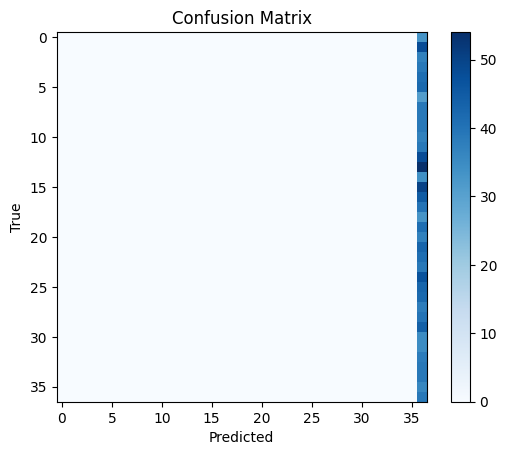

In [ ]:
classify(pca_features, labels)

### AvgPool

In [39]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = torchvision.models.googlenet(weights=torchvision.models.GoogLeNet_Weights.IMAGENET1K_V1).to(device)
# print(torchvision.models.feature_extraction.get_graph_node_names(model)[0])
# print(model)
 # extract layer1 and layer3, giving as names `feat1` and feat2`
model = create_feature_extractor(
    model, { 'avgpool': 'feat3'})

Downloading: "https://download.pytorch.org/models/googlenet-1378be20.pth" to /root/.cache/torch/hub/checkpoints/googlenet-1378be20.pth
100%|██████████| 49.7M/49.7M [00:00<00:00, 148MB/s]


#### Feature Extractor

In [40]:
%cd "/content/drive/MyDrive/Vision_project/Features/google_images"
features = np.empty((0, 1024))
labels = np.empty((0))
i = 0
for images, target in tqdm(data_loader):

    output = model(images.to(device))
    feature = output["feat3"].view(images.shape[0], -1)
    features = np.append(features, feature.cpu().detach().numpy(), axis = 0)
    labels = np.append(labels, target, axis = 0)
    with open('images{}.pkl'.format(i), 'wb') as f:
      pickle.dump(images, f)
    i += 1
print(features.shape)
print(labels.shape)

/content/drive/MyDrive/Vision_project/Features/google_images


100%|██████████| 231/231 [02:04<00:00,  1.86it/s]

(7390, 1024)
(7390,)


#### Classification

Accuracy: 78.89039242219215


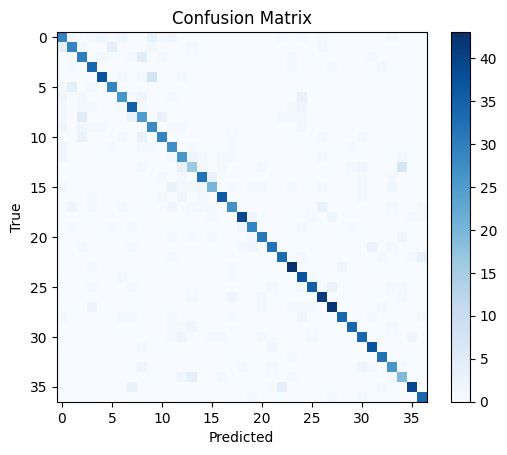

In [28]:
classify(features, labels)

In [41]:
%cd "/content/drive/MyDrive/Vision_project/Features"
with open('goole-avgpool-features.pkl', 'wb') as f:
    pickle.dump(features, f)
with open('goole-avgpool-labels.pkl', 'wb') as f:
    pickle.dump(labels, f)

/content/drive/MyDrive/Vision_project/Features


# Phase 3

In [7]:
def plot_image(index, path, label):
  file_index = int(index / 32)
  image_index = index % 32
  with open(path + str(file_index) + ".pkl", 'rb') as file:
    images = pickle.load(file)
  image = images[image_index].permute(1, 2, 0).numpy()
  plt.imshow(np.clip(image, 0, 1))
  plt.title("Label: {}".format(label))
  plt.show()

In [7]:
# features_pickle_file_path = '/content/drive/MyDrive/Vision_Project/Features/goole-avgpool-features.pkl'
label_pickle_file_path = '/content/drive/MyDrive/Vision_project/Features/goole-avgpool-labels.pkl'

# with open(features_pickle_file_path, 'rb') as file:
#   features = pickle.load(file)

with open(label_pickle_file_path, 'rb') as file:
  labels = pickle.load(file)

# sample_features = features[:4]
# cluster_features = features[4:]
# cluster_labels, sample_labels = labels[4:], labels[:4]
# # cluster_features, sample_features, cluster_labels, sample_labels = train_test_split(features, labels, test_size=0.0005, random_state=20)
# print(cluster_labels.shape)
# print(sample_labels.shape)

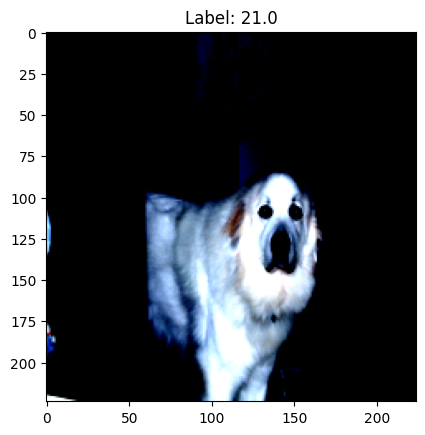

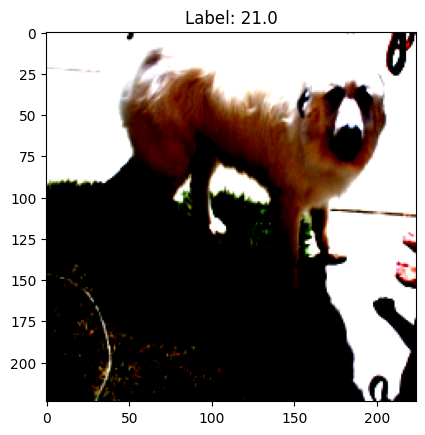

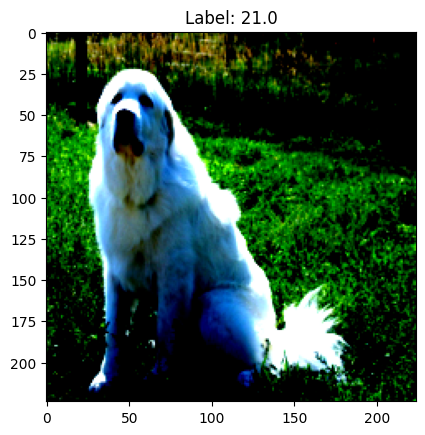

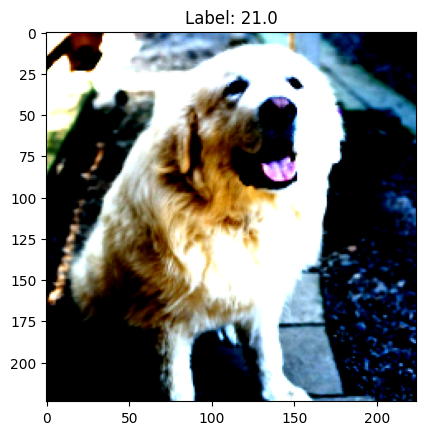

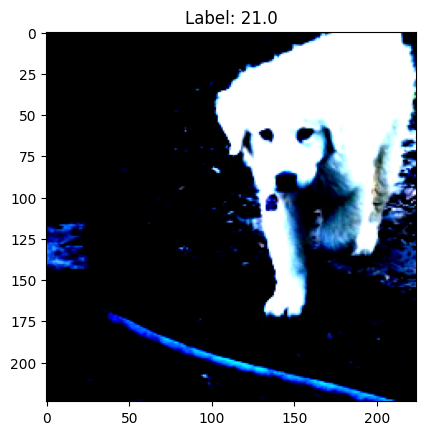

...

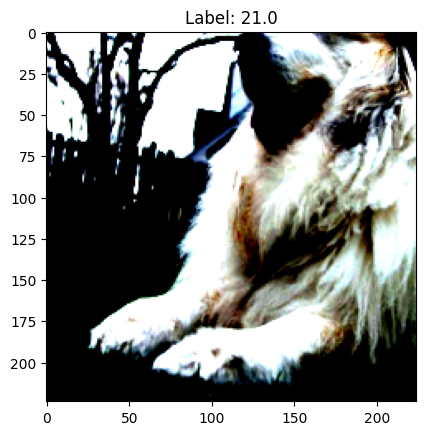

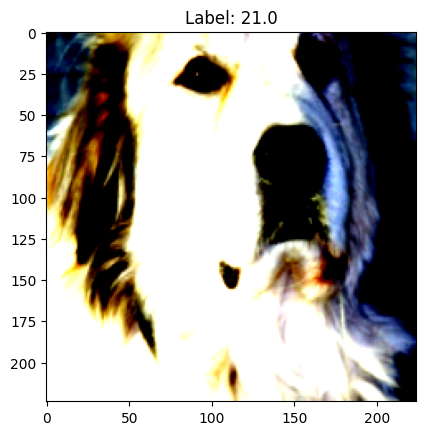

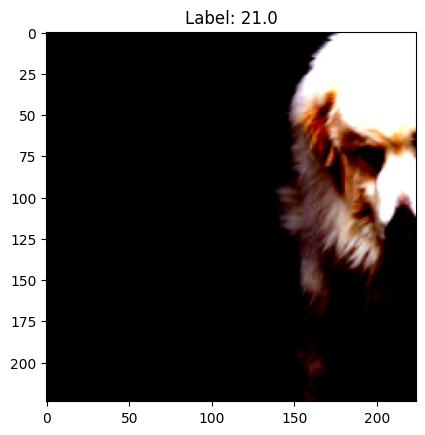

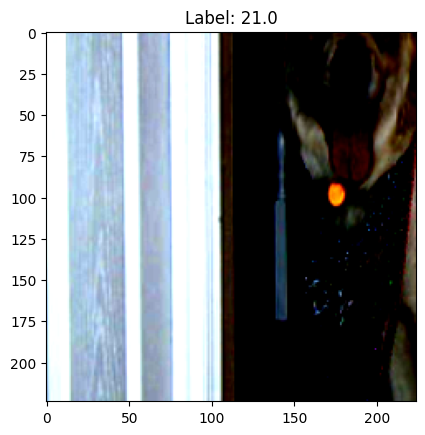

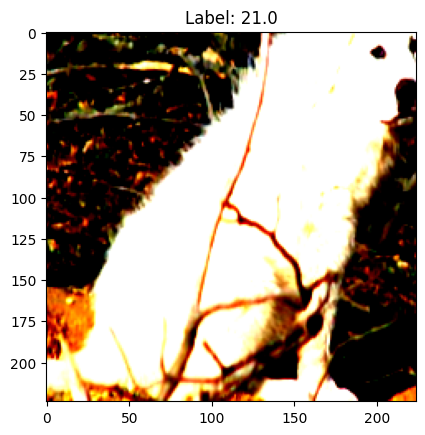

In [8]:
path = "/content/drive/MyDrive/Vision_project/Features/google_images/images"
for i in range(500):
  if labels[i] == 21:
    plot_image(i, path, labels[i])

## Resnet

#### Data Loader

In [10]:
features_pickle_file_path = '/content/drive/MyDrive/Vision_project/Features/resnet-avgpool-features.pkl'
label_pickle_file_path = '/content/drive/MyDrive/Vision_project/Features/resnet-avgpool-labels.pkl'

with open(features_pickle_file_path, 'rb') as file:
  features = pickle.load(file)

with open(label_pickle_file_path, 'rb') as file:
  labels = pickle.load(file)

sample_features = features[:4]
cluster_features = features[4:]
cluster_labels, sample_labels = labels[4:], labels[:4]
# cluster_features, sample_features, cluster_labels, sample_labels = train_test_split(features, labels, test_size=0.0005, random_state=20)
print(cluster_labels.shape)
print(sample_labels.shape)

(7386,)
(4,)


### Clustering

In [11]:
k = 40
kmeans = KMeans(n_clusters=k, random_state=42)
labels = kmeans.fit_predict(cluster_features)
print(cluster_labels.shape)
cluster_centers = kmeans.cluster_centers_
print(cluster_centers.shape)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(7386,)
(40, 512)


### Image Retrieval


Sample: 0


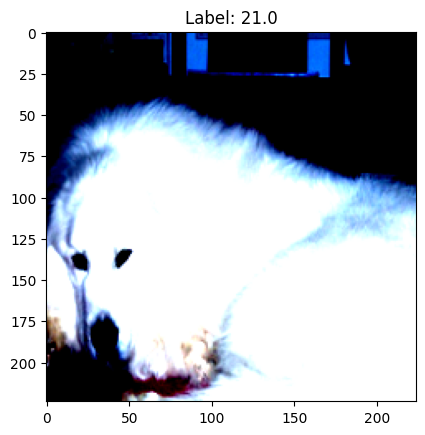

[28. 25. 30. 23. 31. 21. 23.  6.  2.  8.  2. 21.  8.  8.  8. 31.  2. 23.
  8.  7. 19. 24. 22.  2.  8. 23.  8. 21.  8.  8. 23. 25.  7.  7.  6. 21.
  2. 23. 23.  7. 34. 23.  7. 10.  8. 36.  2. 31. 28. 28.  7. 23. 31.  8.
 24. 22.  8. 21.  2.  7. 35. 20. 31.  2.  7.  6. 28. 21.  7. 23.  8.  6.
  2. 33. 23. 24.  7.  2.  8.  2. 31. 35. 22.  7.  8. 28.  2.  7.  8. 28.
  6.  5.  6. 25. 36. 23. 35. 24. 31. 31. 21. 23. 35. 22. 35.  8.  2.  7.
 33.  8.  7.  6.  8.  7. 19. 31.  8.  7.  2. 10.  2.  2.  8.  7. 19.  0.
 18. 33. 22. 30. 28.  8.  6.  8.  4.  2.  2. 35. 21. 33. 10. 23.  8. 35.
 28. 22.  6. 10.  7.  7. 10.  7. 23.  8. 23. 22.  8.  2.  2. 21. 30. 10.
  8. 33.  7. 33. 32. 36. 35. 31. 23.  6.  6. 31.  2.  8.  7.  7. 10.  7.
 24.  2.  2.  7.  6. 19. 19. 35.  7. 21. 21. 17. 25.  8. 32. 25. 22.  2.
  7.  7.  2. 10.  0. 21. 23. 35.  8. 10. 22.  7.  8.  2.  2.  9.  8. 33.
 31. 25.  8.  7. 19.  7.  2. 28. 28. 22. 31.  6.  8.  2.  7.  8.  8. 28.
  8. 30.  6. 35.  2. 35. 21. 22.  2. 31.  8. 22.  8

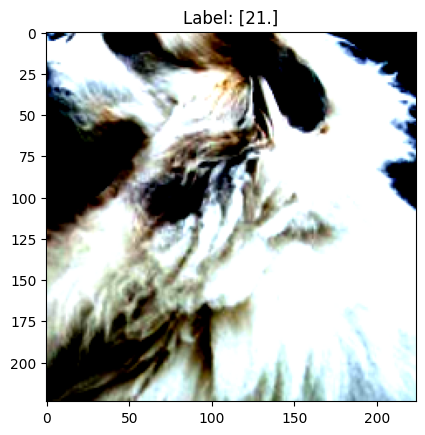

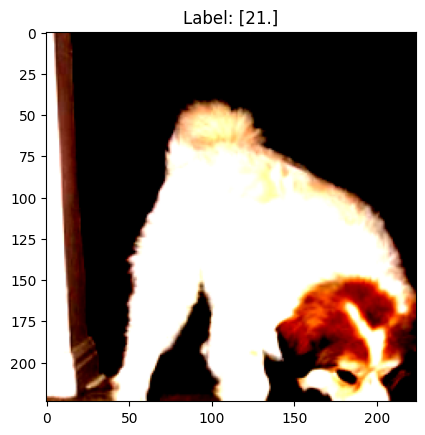

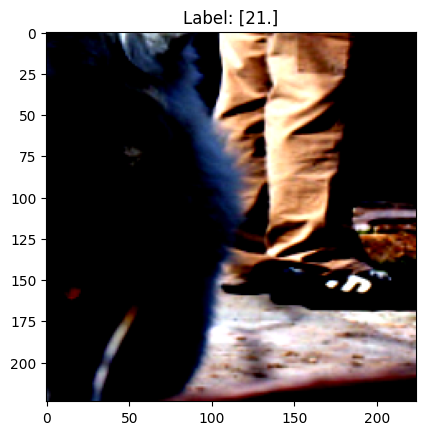


Sample: 1


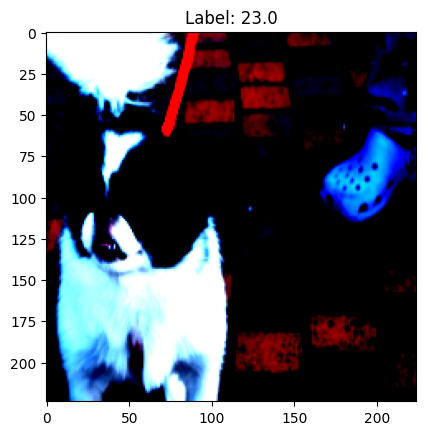

[19. 18. 19. 19. 19. 19. 19. 19. 19. 19. 18. 19. 19. 19. 19. 19. 19. 19.
 18. 19. 19. 19. 19. 19. 19. 19. 18. 19. 18. 19. 18. 19. 19. 19. 18. 19.
 19. 20. 19. 18. 18. 18. 20. 19. 19. 19. 19. 18. 19. 19. 19. 19. 19. 19.
 19. 19. 19. 19. 19. 19. 19. 19. 19. 18. 20. 19. 19. 19. 18. 19. 19. 19.
 19. 19. 19. 18. 19. 19. 19. 19. 19. 19. 18. 19. 19. 19. 19. 19. 19. 18.
 19. 19. 19. 19. 18. 19. 19. 19. 18. 19. 19. 19. 19. 19. 19. 19. 18. 19.
 19. 19. 19. 19. 19. 18. 19. 19. 19. 19. 18. 18. 19. 18. 19. 19. 19. 18.
 19. 19. 18. 18. 19. 18. 22. 19. 19. 18. 18. 19. 19. 19. 18. 19. 19. 19.
 19. 19. 19. 19. 18. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19.
 18. 19. 19. 19. 19. 18. 18. 19. 14. 19. 18. 19. 18. 19. 18. 18.]


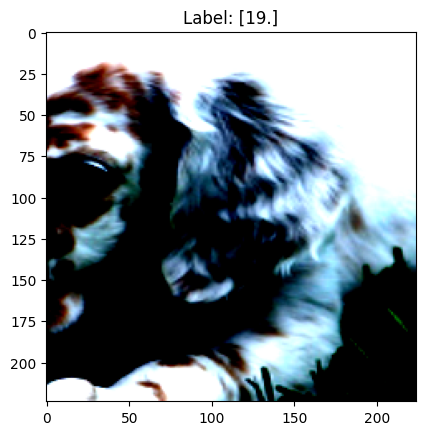

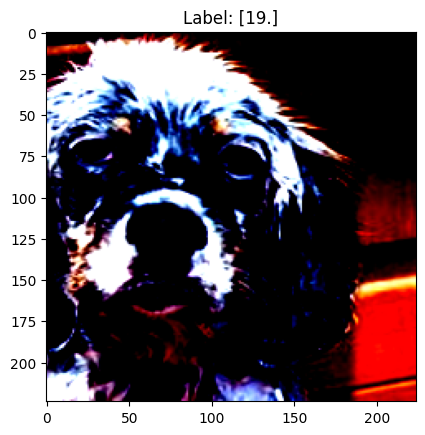

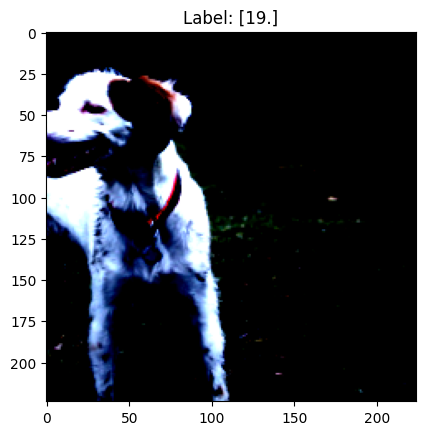


Sample: 2


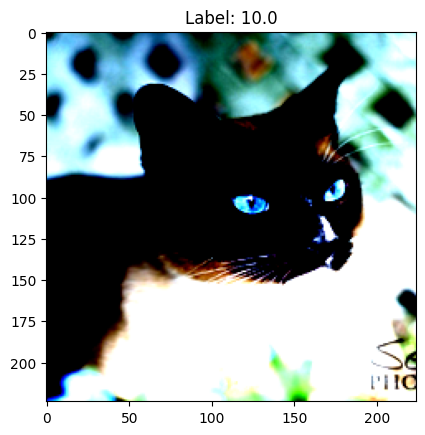

[26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 17.
 26. 26. 26. 26. 26. 26. 26. 26. 26. 17. 26. 26. 26. 26. 26. 26. 26. 26.
 26. 26. 26. 26. 26. 26. 26. 17. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26.
 26. 26. 26. 26. 26. 17. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26.
 17. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26.
 26. 26. 17. 17. 15. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26.
 26. 26. 17. 26. 26. 26. 26. 26. 26. 26.]


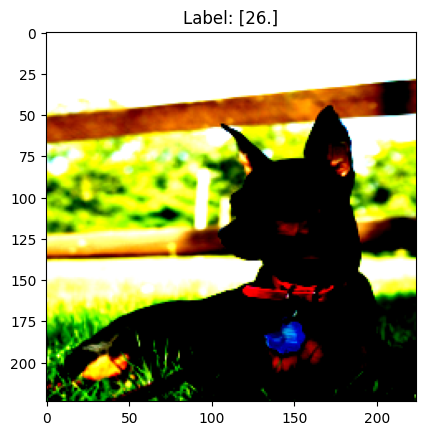

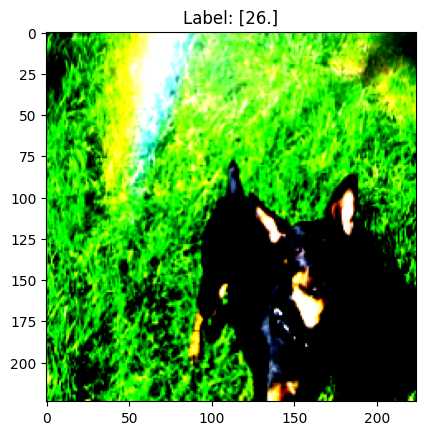

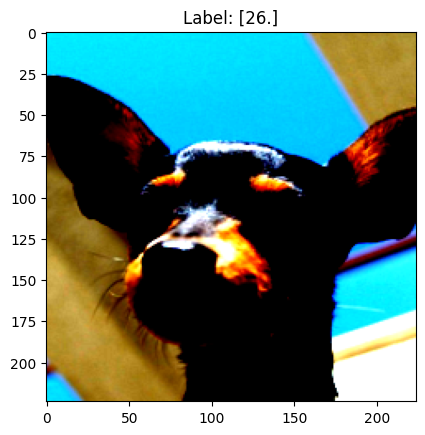


Sample: 3


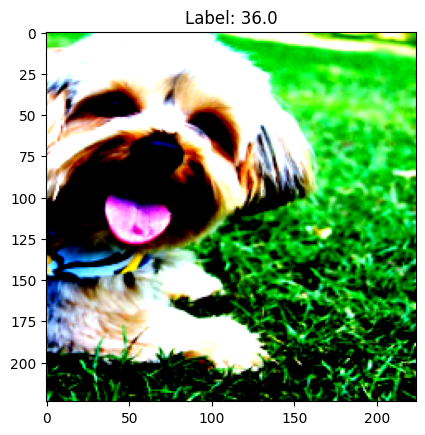

[26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 17.
 26. 26. 26. 26. 26. 26. 26. 26. 26. 17. 26. 26. 26. 26. 26. 26. 26. 26.
 26. 26. 26. 26. 26. 26. 26. 17. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26.
 26. 26. 26. 26. 26. 17. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26.
 17. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26.
 26. 26. 17. 17. 15. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26.
 26. 26. 17. 26. 26. 26. 26. 26. 26. 26.]


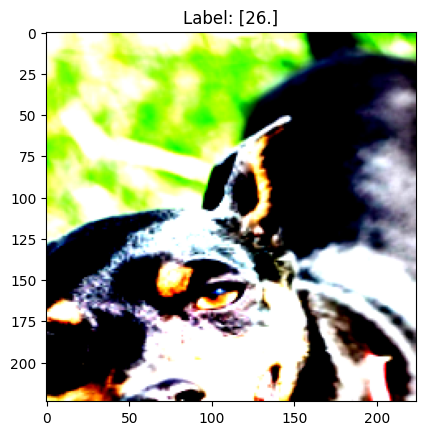

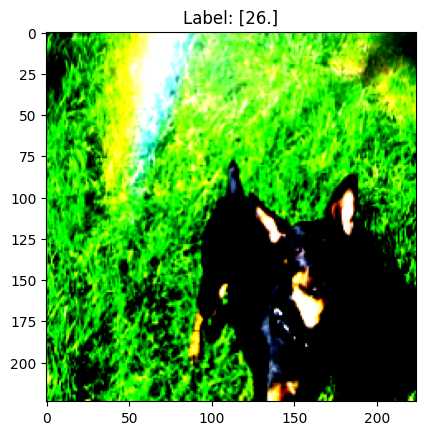

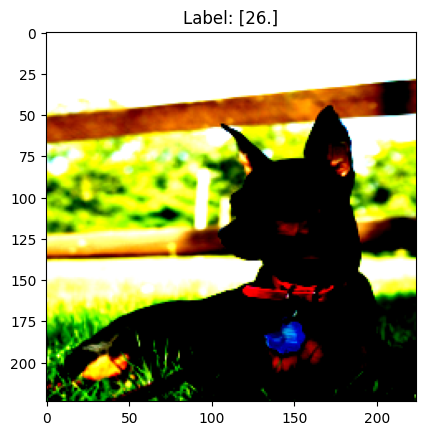

In [24]:
path = "/content/drive/MyDrive/Vision_project/Features/resnet_images/images"
for i in range( 4):
  print()
  print("Sample:", i)
  plot_image(i, path, sample_labels[i])
  similarities = [cosine_similarity([sample_features[i]], [center])[0][0] for center in cluster_centers]
  most_similar_center_index = np.argmax(similarities)
  most_similar_center_label = labels[most_similar_center_index]

  # index of features with in the same cluster labels
  cluster_indices = np.where(labels == most_similar_center_label)[0]
  # print(cluster_indices.shape)

  # true labels of the features in the same cluster labels
  true_label = cluster_labels[cluster_indices]
  print(true_label)
  # print(cluster_features[cluster_indices].shape)

  # Finding the three closer datas to the center
  distances_to_most_similar_center = cdist(cluster_features[cluster_indices], [cluster_centers[most_similar_center_index]])
  closest_indices = np.argsort(distances_to_most_similar_center, axis=0)[:3]
  indexes = cluster_indices[closest_indices]

  # print(distances_to_most_similar_center[closest_indices])
  for idx in indexes:
      plot_image(idx[0] + 4 , path, cluster_labels[idx])

## Google-Net

### Data Loader

In [4]:
features_pickle_file_path = '/content/drive/MyDrive/Vision_project/Features/goole-avgpool-features.pkl'
label_pickle_file_path = '/content/drive/MyDrive/Vision_project/Features/goole-avgpool-labels.pkl'

with open(features_pickle_file_path, 'rb') as file:
  features = pickle.load(file)

with open(label_pickle_file_path, 'rb') as file:
  labels = pickle.load(file)

sample_features = features[:4]
cluster_features = features[4:]
cluster_labels, sample_labels = labels[4:], labels[:4]
# cluster_features, sample_features, cluster_labels, sample_labels = train_test_split(features, labels, test_size=0.0005, random_state=20)
print(cluster_labels.shape)
print(sample_labels.shape)

(7386,)
(4,)


### Clustering

In [14]:
k = 60
kmeans = KMeans(n_clusters=k, random_state=42)
labels = kmeans.fit_predict(cluster_features)
print(cluster_labels.shape)
cluster_centers = kmeans.cluster_centers_
print(cluster_centers.shape)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(7386,)
(60, 1024)


### Image Retrieval


Sample: 0


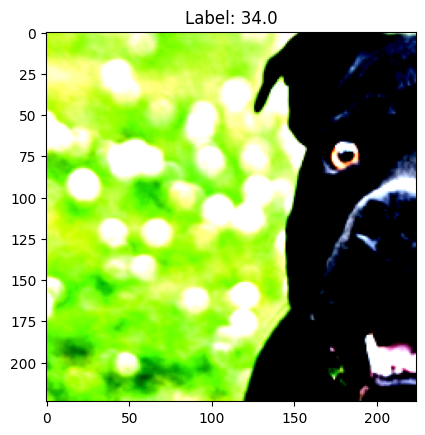

[18. 19. 18. 18. 27. 18. 18. 19. 19. 18. 18. 18. 19. 18. 18. 18. 18. 18.
 18. 18. 18. 18. 18. 18. 19. 19. 19. 18. 19. 18. 18. 18. 19. 18. 18. 19.
 18. 19. 18. 18. 18. 18. 19. 18. 19. 18. 19. 18. 18. 18. 19. 18. 18. 18.
 18. 18. 18. 18. 18. 18. 18. 18. 18. 18. 18. 18. 18. 19. 18. 18. 19. 18.
 18. 18. 19. 19. 18. 19. 19. 18. 18. 19. 18. 19. 18. 18. 19. 18. 19. 18.
 18. 19. 18. 18.]


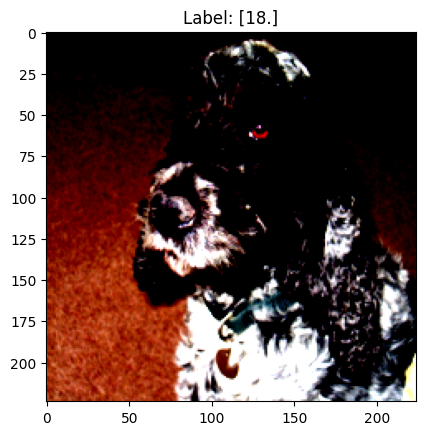

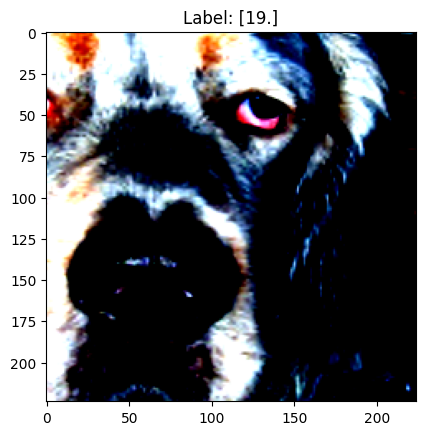

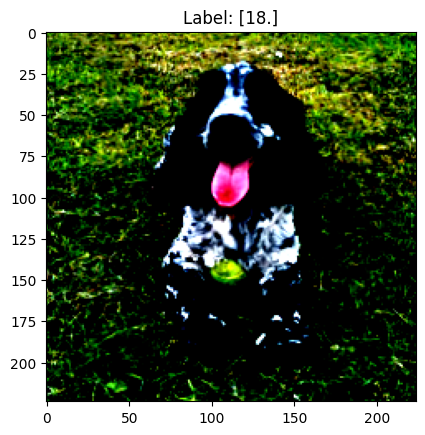


Sample: 1


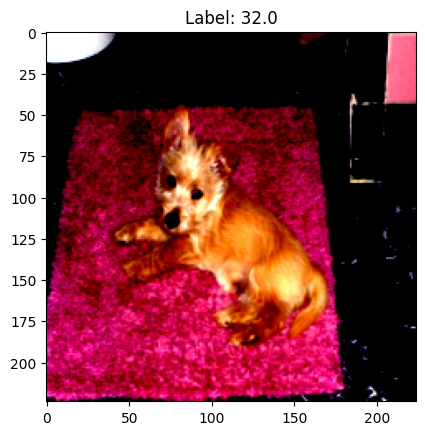

[25. 25. 25. 25. 24. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25.
 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25.
 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25.
 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25.
 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25.
 25. 25. 25. 25. 30. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25.
 25. 25. 25. 25. 25. 24. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25.
 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25.]


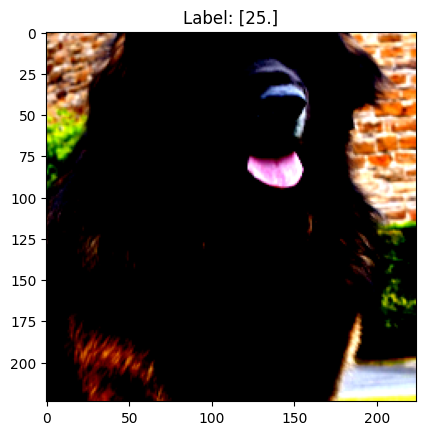

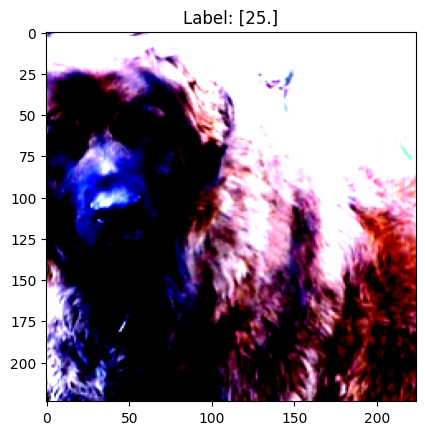

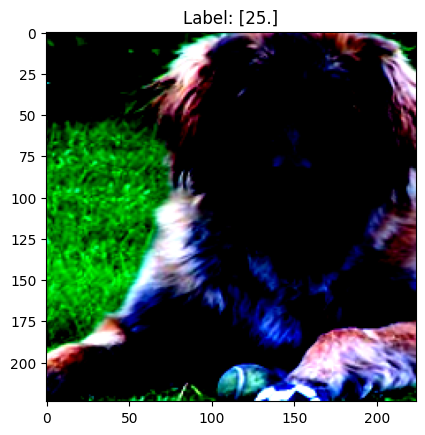


Sample: 2


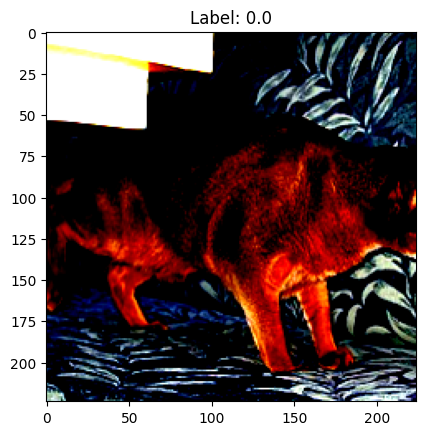

[ 5.  1.  5.  1.  1.  5.  1.  1.  5.  1.  1.  1.  5.  5.  1.  6.  5.  1.
  1.  5.  5.  1.  1.  5.  1.  5.  1.  5.  1.  5.  5.  5.  6.  1.  1.  1.
  1.  6. 19.  1.  5.  5.  5.  1.  1.  1.  1.  1.  1.  5.  1.  1.  1.  5.
  1.  5.  1.  1.  1.  5.  1.  5.  1.  5.  1.  5.  5.  1.  5.  1.  1.  5.
  1.  5.  1.  1.  5.  1.  5.  1.  1.  5.  5.  1.  1.  5.  1.  5.  1.  5.
  5.  1.  5.  1.  1.  1.  5.  1.  1.  5.  5.  5.  5.  1.  5.  1.  1.  5.
  5.  5.  1.  1.  1.  1.  1.  1.  1.  1.  5.  5.  5.  5.  5.  1.  5.  1.
  1.  1.  5.  1.  1.  5.  1.  1.  6.  5.  5.  1.  5.  5.  5.  1.  5.  1.
  1.  5.  5.  5.  1.  5.  5.  5.  5.  5.  5.  5.  5.  1.  5.  5.  1.  5.
  1.  1.  1.  5.  1.  1.  5.  5.  1.  5.  5.  5.  1.  5.  5.  5.  1.  6.
  5.  5.  1.  1.  1.  5.  5.  5.  5.  1.  5.  1.  5.  5.  1.  5.  1.  5.
  1.  5.  1.  1.  6.]


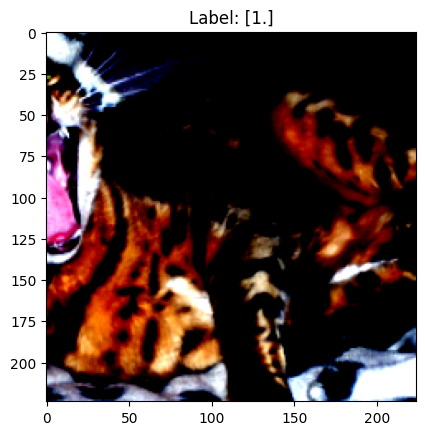

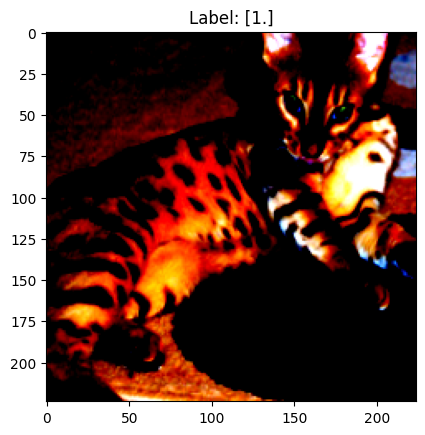

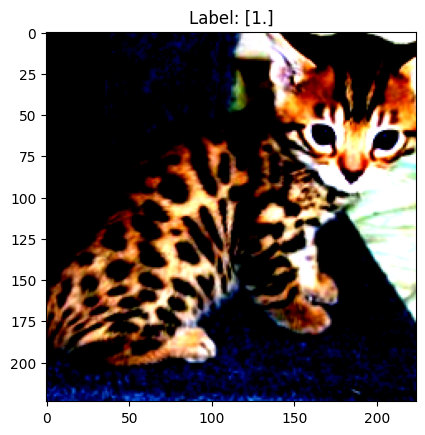


Sample: 3


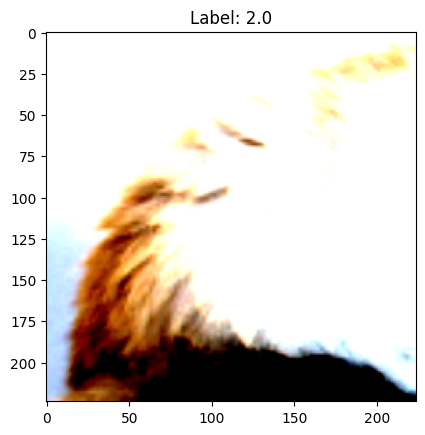

[ 2. 10. 10. 10.  2.  8.  8.  2.  2.  8.  8.  2.  8. 10. 10.  2.  8.  2.
  8.  2.  2.  8.  8.  2. 10.  2.  2.  2.  8. 10.  2.  8.  2.  8.  8.  2.
  8.  2. 10. 10.  8.  2.  2.  8.  8.  2.  2. 10. 10.  8.  8.  2.  2.  2.
  8.  2.  8.  8.  2.  2.  2. 10.  2.  2.  2.  2.  2.  2.  2. 10. 10.  2.
  2.  2.  2. 10.  2.  8.  2.  2.  8.  8. 10. 10.  2.  2.  8.  2.  8.  2.
 10. 10.  2.  8.  8.  2.  8. 10. 10. 10. 10.  2. 10.  2.  2.  2. 10.  2.
  8. 10.  2.  2.  2.  2.  2.  2. 10.  8.  2.  2. 10. 10.  2. 10.  2.  8.
 10.  2.  2.  2. 10.  2. 10.  8.  2.  2.  2.  2. 10.  2.  2.  2.  2.  8.
  2.  3.  2.  2.  8. 10.  2.  8. 10.  8.  2.  2.  2.  8.  2.  2.  2.  8.
 10.  2.  8. 10.  8.  8.  2.  8.  2.  2.  8.  2.  2.  2.  8.  2.]


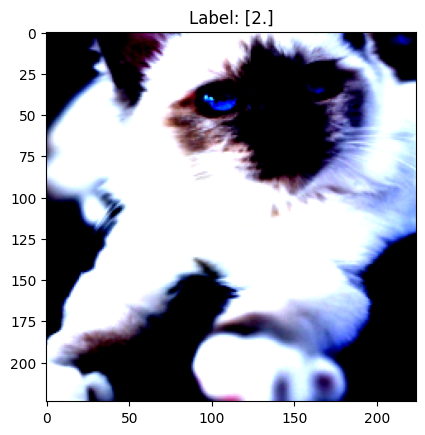

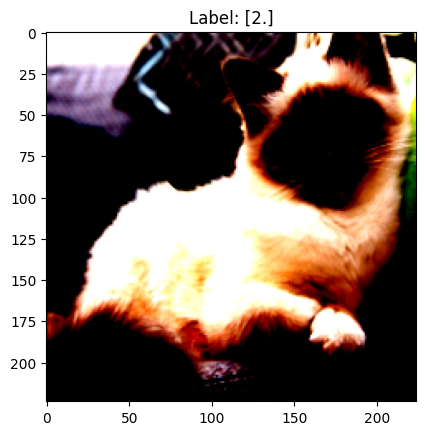

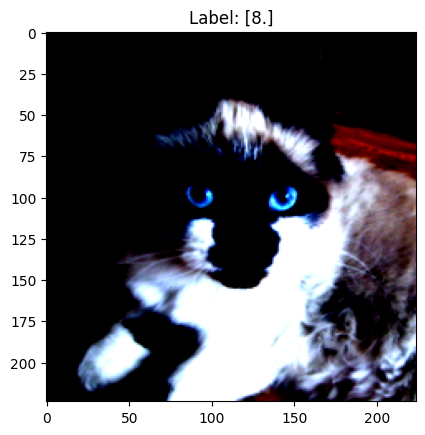

In [15]:
path = "/content/drive/MyDrive/Vision_project/Features/google_images/images"
for i in range( 4):
  print()
  print("Sample:", i)
  plot_image(i, path, sample_labels[i])
  similarities = [cosine_similarity([sample_features[i]], [center])[0][0] for center in cluster_centers]
  most_similar_center_index = np.argmax(similarities)
  most_similar_center_label = labels[most_similar_center_index]

  # index of features with in the same cluster labels
  cluster_indices = np.where(labels == most_similar_center_label)[0]
  # print(cluster_indices.shape)

  # true labels of the features in the same cluster labels
  true_label = cluster_labels[cluster_indices]
  print(true_label)
  # print(cluster_features[cluster_indices].shape)

  # Finding the three closer datas to the center
  distances_to_most_similar_center = cdist(cluster_features[cluster_indices], [cluster_centers[most_similar_center_index]])
  closest_indices = np.argsort(distances_to_most_similar_center, axis=0)[:3]
  indexes = cluster_indices[closest_indices]

  # print(distances_to_most_similar_center[closest_indices])
  for idx in indexes:
      plot_image(idx[0] + 4 , path, cluster_labels[idx])

## Mobile-Net

### Data Loader

In [33]:
sample_features = features[:4]
cluster_features = features[4:]
cluster_labels, sample_labels = labels[4:], labels[:4]
# cluster_features, sample_features, cluster_labels, sample_labels = train_test_split(features, labels, test_size=0.0005, random_state=20)
print(cluster_labels.shape)
print(sample_labels.shape)

(7386,)
(4,)


### Clustering

In [45]:
k = 36
kmeans = KMeans(n_clusters=k, random_state=42)
labels = kmeans.fit_predict(cluster_features)
print(cluster_labels.shape)
cluster_centers = kmeans.cluster_centers_
print(cluster_centers.shape)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(7386,)
(36, 1280)



Sample: 0


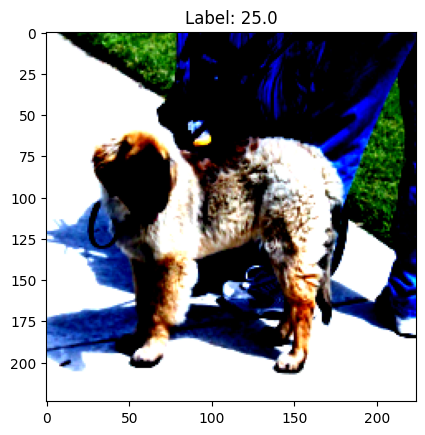

[24.  7. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24.
 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24.
 24. 24. 24. 28. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24.
 24. 24. 25. 24. 24. 25. 24. 24. 24. 24. 24. 24. 21. 24. 24. 24. 24. 24.
 24. 24.  7. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24.
 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24.
 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 25. 24.
 24. 24. 24. 24. 28. 24. 24. 24. 24. 24. 24. 24. 28. 24. 24. 24. 24. 24.
 24.  2. 24.  7. 24.]


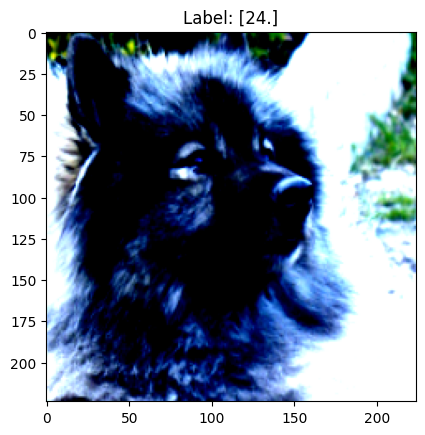

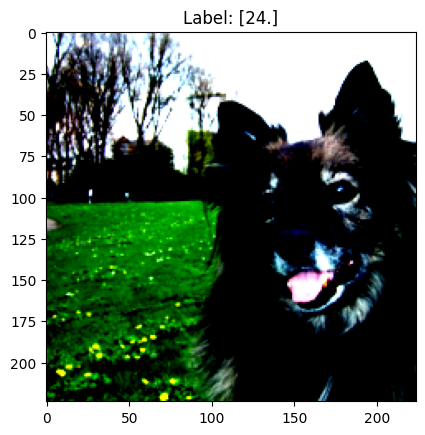

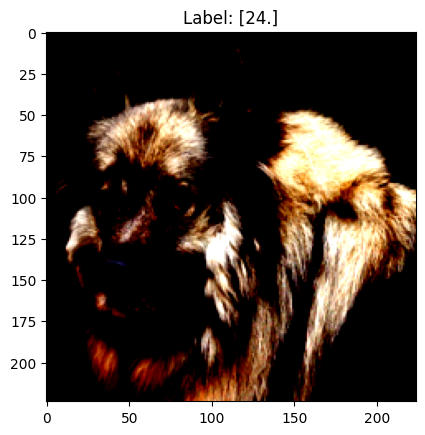


Sample: 1


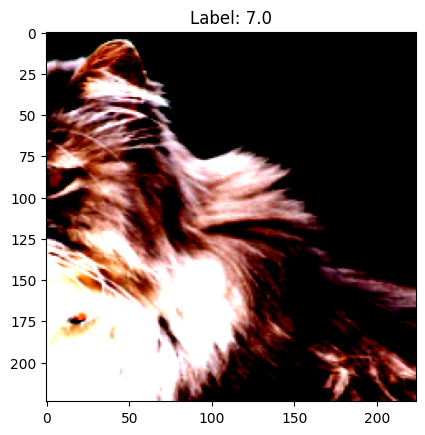

[10.  2. 10.  2.  2.  2. 10. 10.  2.  2. 10. 10.  2.  2.  8.  2.  2.  2.
 10.  2.  2. 10.  8. 10. 10.  2. 10.  8.  2.  8. 10. 10.  2. 10.  8. 10.
 10. 10.  2.  8. 10.  2.  8.  0.  2.  2.  2. 10.  2. 10.  2.  2.  8. 10.
  8.  8.  2.  2.  2. 10.  2.  8. 10.  2.  2. 10.  2. 10. 10. 10. 10.  2.
  2.  2.  8.  8.  2.  8.  2.  8. 10. 10.  8.  8. 10.  8.  2. 10.  8.  8.
 10. 10. 10.  2.  2.  2.  2.  2.  2. 10.  2.  2. 10. 10. 10. 10.  2.  8.
  2. 10. 10.  8.  0. 10.  2.  2.  2.  2.  8.  2. 10. 10.  2. 10.  8.  2.
  2. 10. 10. 10. 10. 10.  8. 10.  8. 10. 10.  0. 10.  2. 10. 10.  2.  2.
  2.  2. 10.  2. 10.  2.  8.  2.  2.  8. 10.  2.  8.  2.  2.  8. 10.  2.
  2.  8. 10.  8.  2. 10.  2. 10.  8.  2. 10.  2.  8.  2.  8. 10.  8. 10.
 10. 10.  2.  2. 10. 10. 10. 10.  8. 10.  2. 10.  2.  2.  8. 10. 10. 10.
  8.  2. 10.  2.  2.  2.  8.  2.  2.  2.  2. 10. 10.  2. 10.  0.  2. 10.
  2. 10.  8. 10.  2.  2.  2. 10. 10. 10.  9.  8. 10.  8. 10.  8.  2. 10.
 10.  2. 10. 10. 10.  2.  2.  4.  2.  2. 10.  2.  2

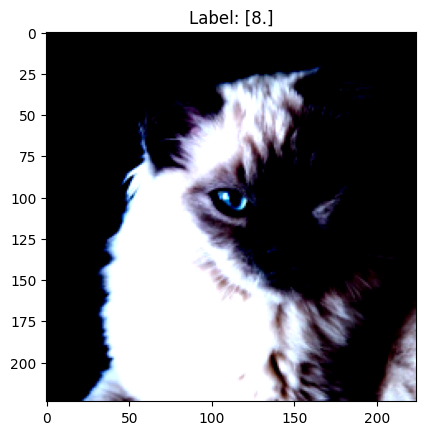

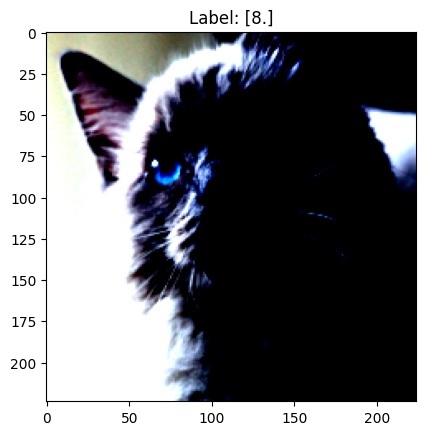

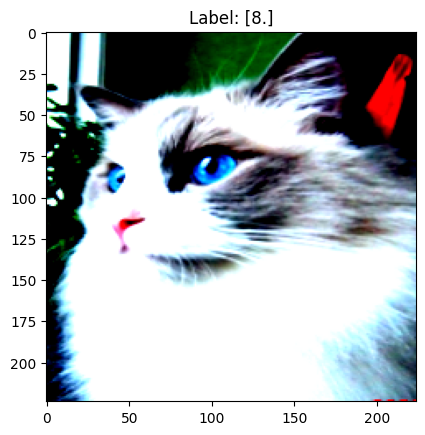


Sample: 2


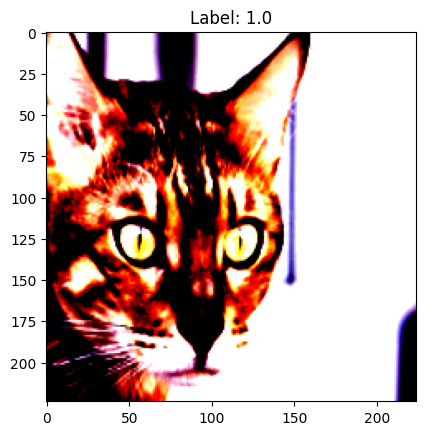

[26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 17. 26. 26. 26. 26. 26. 26. 26.
 28. 17. 26. 26. 26. 26. 17. 17. 26. 26. 16. 26. 17. 17. 26. 26. 26. 26.
 26. 26. 26. 26. 26. 17.  0. 17. 11. 26. 13. 13. 26. 26. 17. 16. 26. 26.
 17. 26. 26. 13. 36. 26. 13. 15. 17. 26. 17. 26.  1. 26. 26. 26. 17. 26.
 26. 26. 26. 26. 26. 26. 26. 26. 26. 17. 19. 26. 26. 26. 26. 26. 26. 26.
 26. 26. 26. 26. 26. 17. 13. 26. 26. 26. 26. 26. 26. 15. 26. 26. 26. 26.
 26. 26. 13. 17. 17. 26. 26. 26. 26. 20. 12. 26. 26. 17. 26. 26. 26. 26.
 17. 26. 26. 17. 20. 26. 13. 26. 17. 26. 26. 26. 13. 26. 26. 26. 26. 26.
 26. 26. 17. 26. 26. 26. 26. 17. 26. 26. 26. 26. 17. 26. 13. 17.]


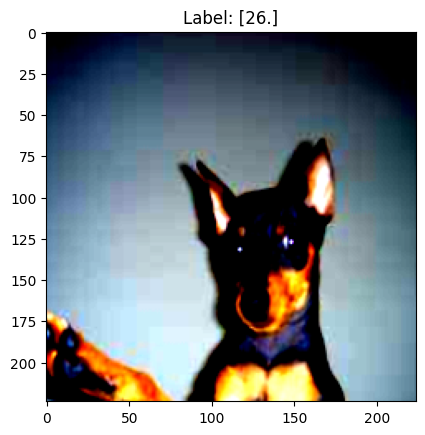

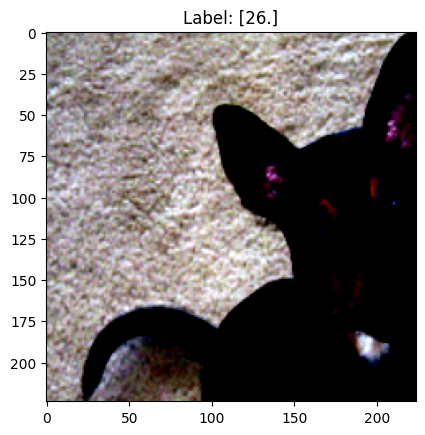

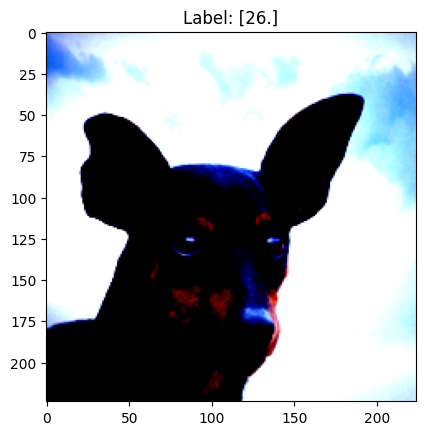


Sample: 3


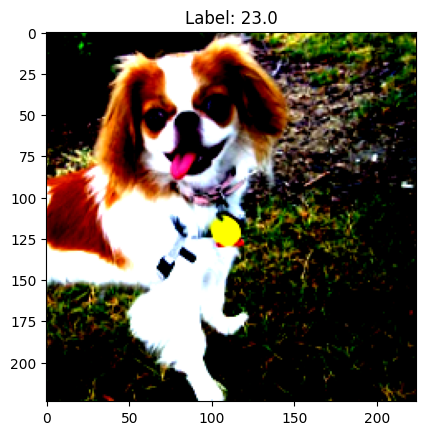

[25. 27. 27. 27. 18. 18. 27. 27. 27. 27. 27. 18. 35. 27. 27. 27. 27. 27.
 27. 27. 18. 27. 28. 27. 27. 27. 27. 25. 27. 27. 27. 27. 36. 27. 18. 27.
 24. 27. 27. 27. 25. 18. 27. 27. 25. 27. 27. 27. 27. 18. 32. 27. 27. 32.
 27. 18. 27. 27. 27. 27. 27. 27. 27. 27. 32. 27. 27. 27. 27. 27. 27. 27.
 27. 27. 27. 32. 27. 27. 27. 18. 18. 27. 27. 27. 18. 27. 27. 27. 18. 27.
 27. 18. 27. 27. 27. 27. 27. 27. 27. 27. 27. 27. 18. 27. 27. 27. 27. 27.
 27. 27. 27. 27. 27. 27. 27. 27. 18. 27. 22. 27. 18. 27. 21. 25. 32. 27.
 27. 18. 27. 27. 27. 27. 17. 27. 27.  3. 27. 18. 18. 27. 27. 27. 27. 27.
 27. 27. 27. 32. 27. 13. 36. 18. 27. 27. 27. 25. 18. 27. 27. 27. 27. 27.
 18. 27. 27. 27. 27. 27. 27. 18. 27. 25. 30. 27. 27. 27. 27. 18. 27. 27.
 27. 27. 27. 19. 25. 27. 27. 27. 32. 24.]


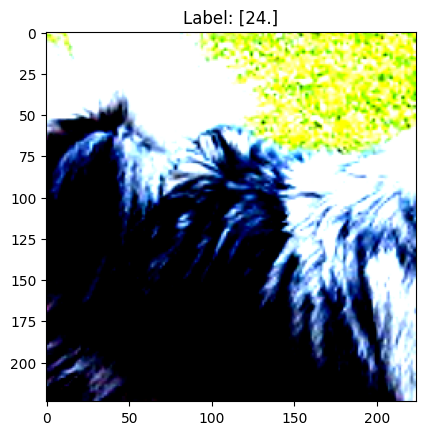

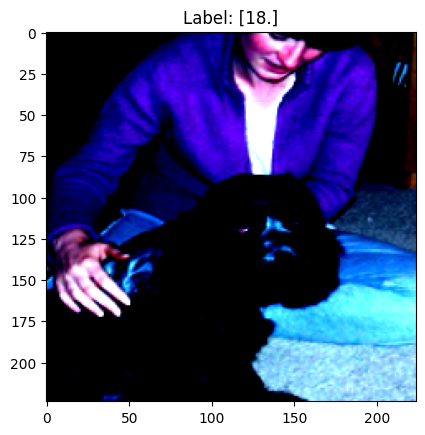

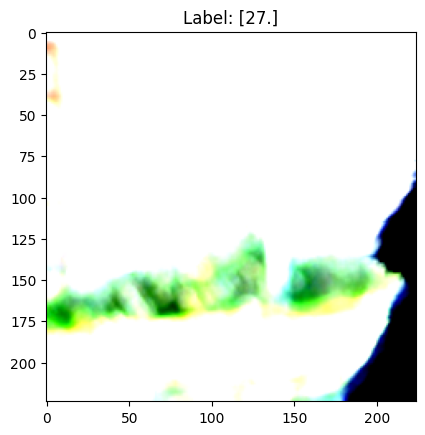

In [49]:
path = "/content/images"
for i in range(4):
  print()
  print("Sample:", i)
  plot_image(i, path, sample_labels[i])
  similarities = [cosine_similarity([sample_features[i]], [center])[0][0] for center in cluster_centers]
  most_similar_center_index = np.argmax(similarities)
  most_similar_center_label = labels[most_similar_center_index]

  # index of features with in the same cluster labels
  cluster_indices = np.where(labels == most_similar_center_label)[0]
  # print(cluster_indices.shape)

  # true labels of the features in the same cluster labels
  true_label = cluster_labels[cluster_indices]
  print(true_label)
  # print(cluster_features[cluster_indices].shape)

  # Finding the three closer datas to the center
  distances_to_most_similar_center = cdist(cluster_features[cluster_indices], [cluster_centers[most_similar_center_index]])
  closest_indices = np.argsort(distances_to_most_similar_center, axis=0)[:3]
  indexes = cluster_indices[closest_indices]

  # print(distances_to_most_similar_center[closest_indices])
  for idx in indexes:
      plot_image(idx[0] + 4 , path, cluster_labels[idx])